# import package

In [2]:
import pandas as pd
import numpy as np
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
import seaborn as sns
from numpy.linalg import inv, pinv

# input case 1

In [3]:
N = 50
mx_1, my_1 = 1, 1
mx_2, my_2 = 10, 10
vx_1, vy_1, vx_2, vy_2 = 2, 2, 2, 2

# input case 2

In [4]:
# N = 50
# mx_1, my_1 = 1, 1
# mx_2, my_2 = 3, 3 
# vx_1, vy_1, vx_2, vy_2 = 2, 2, 4, 4

# Generate Random Variable

In [5]:
def create_dataset():
    container = pd.DataFrame()
    x1_g1 = np.random.normal(mx_1, vx_1, N)
    x1_g2 = np.random.normal(mx_2, vx_2, N)
    y1_g1 = np.random.normal(my_1, vy_1, N)
    y1_g2 = np.random.normal(my_2, vy_2, N)
    Y = np.hstack( (np.zeros(N), np.ones(N)) )
    container["intercept"] = np.hstack( (np.ones(2*N)))
    container["x1"] = np.hstack( (x1_g1, x1_g2) )
    container["x2"] = np.hstack( (y1_g1, y1_g2) )
    container["Y"] = Y
    return(container )

In [6]:
data = create_dataset()

Y, X = data["Y"], data[["intercept", "x1", "x2"]]

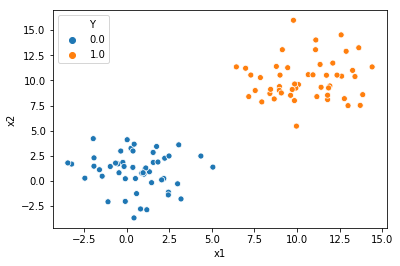

In [7]:
sns.scatterplot(x = "x1", y = "x2", hue = "Y", data = data)

In [8]:
X.head()

,intercept,x1,x2
0,1.0,-2.444343,0.277719
1,1.0,-3.221185,1.680677
2,1.0,0.371838,1.351680
3,1.0,2.186874,0.247539
4,1.0,1.762850,3.429852


In [9]:
X.shape

(100, 3)

# Gradient descent
    

In [10]:
Wj = np.array([1, 1, 1])
lamb = 0.5

In [11]:
for i in range(100):
    fwx = 1/( 1+ np.exp( -X.dot(Wj) ) )
    Wj = Wj - lamb * X.T.dot( fwx - Y )
    print("\n", i)
    print(Wj)


 0
intercept   -19.040476
x1          -17.179221
x2          -26.709686
dtype: float64

 1
intercept      2.464774
x1           246.261293
x2           232.645903
dtype: float64

 2
intercept    -16.535226
x1           225.226098
x2           203.776789
dtype: float64

 3
intercept    -35.535225
x1           204.190904
x2           174.907674
dtype: float64

 4
intercept    -53.535235
x1           182.166878
x2           147.299049
dtype: float64

 5
intercept    -70.535236
x1           159.445233
x2           120.817587
dtype: float64

 6
intercept    -87.535236
x1           136.723588
x2            94.336125
dtype: float64

 7
intercept   -104.030642
x1           113.678982
x2            68.750698
dtype: float64

 8
intercept   -118.130859
x1            89.514288
x2            47.692351
dtype: float64

 9
intercept   -130.766383
x1            65.672893
x2            29.262084
dtype: float64

 10
intercept   -137.834905
x1            48.082085
x2            17.281967
dtype: float64



c:\users\chuck\desktop\python\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


In [12]:
data_result = data
data_result["result"] = 1/( 1+ np.exp( -X.dot(Wj) ) ) <= 0.5

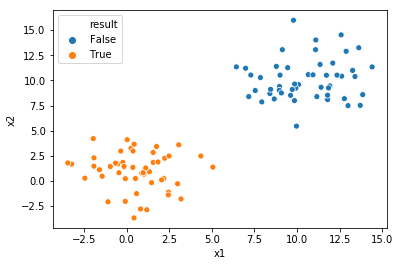

In [13]:
sns.scatterplot(x = "x1", y = "x2", hue = "result", data = data_result)

In [15]:
pd.crosstab(data["Y"], data_result ["result"])

result,False,True
Y,,
0.0,0,50
1.0,50,0


# Newton method

In [20]:
Wn = [1, 1, 1]

In [21]:
# top = np.exp( -X.dot(Wn) )

# down =  1 + np.exp( -X.dot(Wn) )

# np.exp( -X.dot(Wn) )[0]

In [22]:
def buf_f(f_):
    top = np.exp(-1*f_)
    down =  np.square(1 + top)
    return(top/down)

In [23]:
for i in range(10000):
    buf = X.dot(Wn)
    buf2 = list(map(buf_f, buf))
    fwx = 1/( 1+ np.exp( -X.dot(Wn) ) )
    if( sum(np.isnan(buf2)) >= 1):
        Wn = Wn - lamb * X.T.dot( fwx - Y )
    else:
        R = np.diag(buf2)
        Wn = Wn - inv( X.T.dot(R).dot(X) ).dot(X.T.dot(fwx - Y))
    print("\n", i)
    print(Wn)


 0
[-9.62497019 -9.41492324 -9.53143863]

 1
[50524.1765998  50914.61536123 56728.26400312]

 2
intercept    50503.176600
x1           50896.669167
x2           56702.589327
dtype: float64

 3
intercept    50482.176600
x1           50878.722972
x2           56676.914651
dtype: float64

 4
intercept    50461.176600
x1           50860.776777
x2           56651.239975
dtype: float64

 5
intercept    50440.176600
x1           50842.830582
x2           56625.565299
dtype: float64

 6
intercept    50419.176600
x1           50824.884388
x2           56599.890623
dtype: float64

 7
intercept    50398.176600
x1           50806.938193
x2           56574.215947
dtype: float64

 8
intercept    50377.176600
x1           50788.991998
x2           56548.541270
dtype: float64

 9
intercept    50356.176600
x1           50771.045803
x2           56522.866594
dtype: float64

 10
intercept    50335.176600
x1           50753.099609
x2           56497.191918
dtype: float64

 11
intercept    50314.176600
x1

c:\users\chuck\desktop\python\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
c:\users\chuck\desktop\python\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in double_scalars
  after removing the cwd from sys.path.
c:\users\chuck\desktop\python\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in exp
  after removing the cwd from sys.path.


 76
intercept    48949.176600
x1           49568.650757
x2           54802.663296
dtype: float64

 77
intercept    48928.176600
x1           49550.704563
x2           54776.988620
dtype: float64

 78
intercept    48907.176600
x1           49532.758368
x2           54751.313944
dtype: float64

 79
intercept    48886.176600
x1           49514.812173
x2           54725.639268
dtype: float64

 80
intercept    48865.176600
x1           49496.865978
x2           54699.964592
dtype: float64

 81
intercept    48844.176600
x1           49478.919784
x2           54674.289916
dtype: float64

 82
intercept    48823.176600
x1           49460.973589
x2           54648.615240
dtype: float64

 83
intercept    48802.176600
x1           49443.027394
x2           54622.940564
dtype: float64

 84
intercept    48781.176600
x1           49425.081200
x2           54597.265888
dtype: float64

 85
intercept    48760.176600
x1           49407.135005
x2           54571.591211
dtype: float64

 86
intercept    487

 232
intercept    45673.176600
x1           46769.044381
x2           50797.413826
dtype: float64

 233
intercept    45652.176600
x1           46751.098186
x2           50771.739150
dtype: float64

 234
intercept    45631.176600
x1           46733.151992
x2           50746.064474
dtype: float64

 235
intercept    45610.176600
x1           46715.205797
x2           50720.389798
dtype: float64

 236
intercept    45589.176600
x1           46697.259602
x2           50694.715122
dtype: float64

 237
intercept    45568.176600
x1           46679.313408
x2           50669.040445
dtype: float64

 238
intercept    45547.176600
x1           46661.367213
x2           50643.365769
dtype: float64

 239
intercept    45526.176600
x1           46643.421018
x2           50617.691093
dtype: float64

 240
intercept    45505.176600
x1           46625.474823
x2           50592.016417
dtype: float64

 241
intercept    45484.176600
x1           46607.528629
x2           50566.341741
dtype: float64

 242
inter

 402
intercept    42103.176600
x1           43718.191279
x2           46432.718890
dtype: float64

 403
intercept    42082.176600
x1           43700.245084
x2           46407.044214
dtype: float64

 404
intercept    42061.176600
x1           43682.298889
x2           46381.369538
dtype: float64

 405
intercept    42040.176600
x1           43664.352695
x2           46355.694862
dtype: float64

 406
intercept    42019.176600
x1           43646.406500
x2           46330.020186
dtype: float64

 407
intercept    41998.176600
x1           43628.460305
x2           46304.345510
dtype: float64

 408
intercept    41977.176600
x1           43610.514111
x2           46278.670834
dtype: float64

 409
intercept    41956.176600
x1           43592.567916
x2           46252.996158
dtype: float64

 410
intercept    41935.176600
x1           43574.621721
x2           46227.321482
dtype: float64

 411
intercept    41914.176600
x1           43556.675526
x2           46201.646806
dtype: float64

 412
inter

intercept    40066.176600
x1           41977.410391
x2           43942.275309
dtype: float64

 500
intercept    40045.176600
x1           41959.464196
x2           43916.600633
dtype: float64

 501
intercept    40024.176600
x1           41941.518002
x2           43890.925957
dtype: float64

 502
intercept    40003.176600
x1           41923.571807
x2           43865.251281
dtype: float64

 503
intercept    39982.176600
x1           41905.625612
x2           43839.576605
dtype: float64

 504
intercept    39961.176600
x1           41887.679418
x2           43813.901929
dtype: float64

 505
intercept    39940.176600
x1           41869.733223
x2           43788.227253
dtype: float64

 506
intercept    39919.176600
x1           41851.787028
x2           43762.552577
dtype: float64

 507
intercept    39898.176600
x1           41833.840833
x2           43736.877901
dtype: float64

 508
intercept    39877.176600
x1           41815.894639
x2           43711.203225
dtype: float64

 509
intercept 

intercept    36517.176600
x1           38944.503484
x2           39603.255050
dtype: float64

 669
intercept    36496.176600
x1           38926.557289
x2           39577.580374
dtype: float64

 670
intercept    36475.176600
x1           38908.611094
x2           39551.905698
dtype: float64

 671
intercept    36454.176600
x1           38890.664899
x2           39526.231022
dtype: float64

 672
intercept    36433.176600
x1           38872.718705
x2           39500.556346
dtype: float64

 673
intercept    36412.17660
x1           38854.77251
x2           39474.88167
dtype: float64

 674
intercept    36391.176600
x1           38836.826315
x2           39449.206993
dtype: float64

 675
intercept    36370.176600
x1           38818.880121
x2           39423.532317
dtype: float64

 676
intercept    36349.176600
x1           38800.933926
x2           39397.857641
dtype: float64

 677
intercept    36328.176600
x1           38782.987731
x2           39372.182965
dtype: float64

 678
intercept    

 835
intercept    33010.176600
x1           35947.488966
x2           35315.584143
dtype: float64

 836
intercept    32989.176600
x1           35929.542771
x2           35289.909467
dtype: float64

 837
intercept    32968.176600
x1           35911.596576
x2           35264.234791
dtype: float64

 838
intercept    32947.176600
x1           35893.650381
x2           35238.560114
dtype: float64

 839
intercept    32926.176600
x1           35875.704187
x2           35212.885438
dtype: float64

 840
intercept    32905.176600
x1           35857.757992
x2           35187.210762
dtype: float64

 841
intercept    32884.176600
x1           35839.811797
x2           35161.536086
dtype: float64

 842
intercept    32863.176600
x1           35821.865602
x2           35135.861410
dtype: float64

 843
intercept    32842.176600
x1           35803.919408
x2           35110.186734
dtype: float64

 844
intercept    32821.176600
x1           35785.973213
x2           35084.512058
dtype: float64

 845
inter

 942
intercept    30763.176600
x1           34027.246131
x2           32568.393801
dtype: float64

 943
intercept    30742.176600
x1           34009.299936
x2           32542.719125
dtype: float64

 944
intercept    30721.176600
x1           33991.353741
x2           32517.044449
dtype: float64

 945
intercept    30700.176600
x1           33973.407546
x2           32491.369773
dtype: float64

 946
intercept    30679.176600
x1           33955.461352
x2           32465.695097
dtype: float64

 947
intercept    30658.176600
x1           33937.515157
x2           32440.020420
dtype: float64

 948
intercept    30637.176600
x1           33919.568962
x2           32414.345744
dtype: float64

 949
intercept    30616.176600
x1           33901.622768
x2           32388.671068
dtype: float64

 950
intercept    30595.176600
x1           33883.676573
x2           32362.996392
dtype: float64

 951
intercept    30574.176600
x1           33865.730378
x2           32337.321716
dtype: float64

 952
inter

 1130
intercept    26815.176600
x1           30653.361523
x2           27741.554696
dtype: float64

 1131
intercept    26794.176600
x1           30635.415329
x2           27715.880020
dtype: float64

 1132
intercept    26773.176600
x1           30617.469134
x2           27690.205343
dtype: float64

 1133
intercept    26752.176600
x1           30599.522939
x2           27664.530667
dtype: float64

 1134
intercept    26731.176600
x1           30581.576745
x2           27638.855991
dtype: float64

 1135
intercept    26710.176600
x1           30563.630550
x2           27613.181315
dtype: float64

 1136
intercept    26689.176600
x1           30545.684355
x2           27587.506639
dtype: float64

 1137
intercept    26668.176600
x1           30527.738160
x2           27561.831963
dtype: float64

 1138
intercept    26647.176600
x1           30509.791966
x2           27536.157287
dtype: float64

 1139
intercept    26626.176600
x1           30491.845771
x2           27510.482611
dtype: float64



 1240
intercept    24505.176600
x1           28679.280104
x2           24917.340326
dtype: float64

 1241
intercept    24484.176600
x1           28661.333910
x2           24891.665649
dtype: float64

 1242
intercept    24463.176600
x1           28643.387715
x2           24865.990973
dtype: float64

 1243
intercept    24442.176600
x1           28625.441520
x2           24840.316297
dtype: float64

 1244
intercept    24421.176600
x1           28607.495325
x2           24814.641621
dtype: float64

 1245
intercept    24400.176600
x1           28589.549131
x2           24788.966945
dtype: float64

 1246
intercept    24379.176600
x1           28571.602936
x2           24763.292269
dtype: float64

 1247
intercept    24358.176600
x1           28553.656741
x2           24737.617593
dtype: float64

 1248
intercept    24337.176600
x1           28535.710547
x2           24711.942917
dtype: float64

 1249
intercept    24316.176600
x1           28517.764352
x2           24686.268241
dtype: float64



c:\users\chuck\desktop\python\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in square
  This is separate from the ipykernel package so we can avoid doing imports until


 1428
intercept    20650.178197
x1           25040.616723
x2           20312.473297
dtype: float64

 1429
intercept    20630.178197
x1           25020.148735
x2           20288.802079
dtype: float64

 1430
intercept    20610.178197
x1           24999.680748
x2           20265.130860
dtype: float64

 1431
intercept    20590.178197
x1           24979.212760
x2           20241.459642
dtype: float64

 1432
intercept    20570.178197
x1           24958.744773
x2           20217.788424
dtype: float64

 1433
intercept    20550.178197
x1           24938.276785
x2           20194.117205
dtype: float64

 1434
intercept    20530.178197
x1           24917.808798
x2           20170.445987
dtype: float64

 1435
intercept    20510.178197
x1           24897.340811
x2           20146.774769
dtype: float64

 1436
intercept    20490.178197
x1           24876.872823
x2           20123.103550
dtype: float64

 1437
intercept    20470.178197
x1           24856.404836
x2           20099.432332
dtype: float64



 1667
intercept    15940.666998
x1           19983.887910
x2           14792.899820
dtype: float64

 1668
intercept    15921.166998
x1           19962.250376
x2           14770.206400
dtype: float64

 1669
intercept    15901.666998
x1           19940.612842
x2           14747.512980
dtype: float64

 1670
intercept    15882.166998
x1           19918.975309
x2           14724.819561
dtype: float64

 1671
intercept    15862.666998
x1           19897.337775
x2           14702.126141
dtype: float64

 1672
intercept    15843.166998
x1           19875.700242
x2           14679.432721
dtype: float64

 1673
intercept    15823.666998
x1           19854.062708
x2           14656.739302
dtype: float64

 1674
intercept    15804.166998
x1           19832.425174
x2           14634.045882
dtype: float64

 1675
intercept    15784.666998
x1           19810.787641
x2           14611.352462
dtype: float64

 1676
intercept    15765.166998
x1           19789.150107
x2           14588.659042
dtype: float64



intercept    12656.546496
x1           16353.835915
x2           11133.966099
dtype: float64

 1834
intercept    12636.046496
x1           16331.310912
x2           11113.678419
dtype: float64

 1835
intercept    12615.546496
x1           16308.785909
x2           11093.390739
dtype: float64

 1836
intercept    12595.046496
x1           16286.260905
x2           11073.103059
dtype: float64

 1837
intercept    12574.546496
x1           16263.735902
x2           11052.815379
dtype: float64

 1838
intercept    12554.046496
x1           16241.210899
x2           11032.527699
dtype: float64

 1839
intercept    12533.546496
x1           16218.685895
x2           11012.240018
dtype: float64

 1840
intercept    12513.046496
x1           16196.160892
x2           10991.952338
dtype: float64

 1841
intercept    12492.546496
x1           16173.635889
x2           10971.664658
dtype: float64

 1842
intercept    12472.046496
x1           16151.110885
x2           10951.376978
dtype: float64

 1843


 2000
intercept     9293.837655
x1           12523.257941
x2            7779.543532
dtype: float64

 2001
intercept     9273.837655
x1           12500.166224
x2            7759.532373
dtype: float64

 2002
intercept     9253.837655
x1           12477.074506
x2            7739.521213
dtype: float64

 2003
intercept     9233.837655
x1           12453.982789
x2            7719.510054
dtype: float64

 2004
intercept     9213.837655
x1           12430.891071
x2            7699.498894
dtype: float64

 2005
intercept     9193.837655
x1           12407.799354
x2            7679.487735
dtype: float64

 2006
intercept     9173.837655
x1           12384.707636
x2            7659.476575
dtype: float64

 2007
intercept     9153.837655
x1           12361.615919
x2            7639.465416
dtype: float64

 2008
intercept     9133.837655
x1           12338.524201
x2            7619.454256
dtype: float64

 2009
intercept     9113.837655
x1           12315.432484
x2            7599.443096
dtype: float64



intercept    5978.762264
x1           8610.334604
x2           4594.975764
dtype: float64

 2167
intercept    5958.762264
x1           8585.678373
x2           4577.783858
dtype: float64

 2168
intercept    5938.762264
x1           8561.022142
x2           4560.591953
dtype: float64

 2169
intercept    5918.762264
x1           8536.365911
x2           4543.400047
dtype: float64

 2170
intercept    5898.762264
x1           8511.709679
x2           4526.208141
dtype: float64

 2171
intercept    5878.762264
x1           8487.053448
x2           4509.016235
dtype: float64

 2172
intercept    5858.762264
x1           8462.397217
x2           4491.824329
dtype: float64

 2173
intercept    5838.762264
x1           8437.740986
x2           4474.632424
dtype: float64

 2174
intercept    5818.762264
x1           8413.084755
x2           4457.440518
dtype: float64

 2175
intercept    5798.762264
x1           8388.428523
x2           4440.248612
dtype: float64

 2176
intercept    5778.762264
x1   

 2333
intercept    2650.968414
x1           4479.355518
x2           1737.936109
dtype: float64

 2334
intercept    2631.968414
x1           4453.482595
x2           1722.272392
dtype: float64

 2335
intercept    2612.968414
x1           4427.609672
x2           1706.608675
dtype: float64

 2336
intercept    2593.968414
x1           4401.736749
x2           1690.944958
dtype: float64

 2337
intercept    2574.968414
x1           4375.863826
x2           1675.281241
dtype: float64

 2338
intercept    2555.968414
x1           4349.990903
x2           1659.617525
dtype: float64

 2339
intercept    2536.968414
x1           4324.117980
x2           1643.953808
dtype: float64

 2340
intercept    2517.968414
x1           4298.245057
x2           1628.290091
dtype: float64

 2341
intercept    2498.968414
x1           4272.372134
x2           1612.626374
dtype: float64

 2342
intercept    2479.968414
x1           4246.499210
x2           1596.962658
dtype: float64

 2343
intercept    2460.968414

intercept   -253.436888
x1           208.673576
x2          -106.420347
dtype: float64

 2500
intercept   -261.936888
x1           189.377839
x2           -97.936393
dtype: float64

 2501
intercept   -269.936888
x1           173.768490
x2           -83.494418
dtype: float64

 2502
intercept   -277.436853
x1           155.346703
x2           -76.226932
dtype: float64

 2503
intercept   -282.935480
x1           143.141128
x2           -62.875887
dtype: float64

 2504
intercept   -287.440824
x1           129.464417
x2           -56.672920
dtype: float64

 2505
intercept   -290.941263
x1           121.334163
x2           -42.755074
dtype: float64

 2506
intercept   -295.441094
x1           107.667976
x2           -36.552639
dtype: float64

 2507
intercept   -298.945325
x1            97.156569
x2           -28.694228
dtype: float64

 2508
intercept   -301.945335
x1            87.869657
x2           -21.797897
dtype: float64

 2509
intercept    6.581857e+14
x1          -2.426210e+14
x2      

 2666
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2667
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2668
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2669
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2670
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2671
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2672
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2673
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2674
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2675
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2833
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2834
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2835
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2836
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2837
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2838
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2839
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2840
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2841
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 2842


 2999
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3000
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3001
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3002
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3003
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3004
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3005
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3006
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3007
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3008
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3166
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3167
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3168
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3169
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3170
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3171
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3172
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3173
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3174
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3175


 3332
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3333
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3334
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3335
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3336
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3337
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3338
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3339
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3340
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3341
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3499
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3500
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3501
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3502
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3503
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3504
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3505
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3506
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3507
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3508


 3665
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3666
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3667
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3668
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3669
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3670
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3671
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3672
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3673
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3674
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3832
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3833
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3834
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3835
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3836
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3837
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3838
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3839
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3840
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3841


 3998
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 3999
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4000
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4001
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4002
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4003
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4004
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4005
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4006
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4007
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4165
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4166
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4167
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4168
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4169
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4170
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4171
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4172
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4173
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4174


 4331
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4332
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4333
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4334
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4335
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4336
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4337
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4338
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4339
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4340
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4498
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4499
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4500
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4501
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4502
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4503
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4504
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4505
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4506
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4507


 4664
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4665
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4666
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4667
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4668
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4669
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4670
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4671
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4672
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4673
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4831
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4832
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4833
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4834
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4835
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4836
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4837
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4838
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4839
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4840


 4997
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4998
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 4999
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5000
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5001
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5002
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5003
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5004
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5005
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5006
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5164
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5165
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5166
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5167
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5168
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5169
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5170
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5171
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5172
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5173


 5330
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5331
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5332
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5333
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5334
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5335
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5336
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5337
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5338
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5339
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5497
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5498
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5499
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5500
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5501
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5502
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5503
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5504
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5505
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5506


 5663
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5664
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5665
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5666
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5667
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5668
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5669
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5670
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5671
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5672
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5830
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5831
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5832
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5833
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5834
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5835
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5836
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5837
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5838
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5839


 5996
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5997
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5998
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 5999
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6000
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6001
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6002
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6003
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6004
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6005
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6163
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6164
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6165
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6166
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6167
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6168
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6169
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6170
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6171
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6172


 6329
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6330
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6331
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6332
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6333
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6334
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6335
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6336
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6337
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6338
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6496
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6497
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6498
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6499
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6500
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6501
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6502
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6503
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6504
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6505


 6662
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6663
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6664
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6665
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6666
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6667
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6668
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6669
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6670
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6671
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6829
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6830
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6831
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6832
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6833
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6834
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6835
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6836
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6837
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6838


 6995
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6996
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6997
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6998
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 6999
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7000
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7001
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7002
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7003
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7004
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7162
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7163
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7164
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7165
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7166
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7167
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7168
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7169
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7170
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7171


 7328
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7329
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7330
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7331
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7332
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7333
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7334
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7335
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7336
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7337
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7495
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7496
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7497
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7498
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7499
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7500
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7501
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7502
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7503
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7504


 7661
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7662
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7663
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7664
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7665
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7666
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7667
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7668
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7669
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7670
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7828
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7829
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7830
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7831
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7832
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7833
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7834
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7835
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7836
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7837


 7994
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7995
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7996
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7997
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7998
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 7999
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8000
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8001
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8002
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8003
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8161
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8162
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8163
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8164
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8165
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8166
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8167
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8168
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8169
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8170


 8327
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8328
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8329
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8330
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8331
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8332
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8333
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8334
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8335
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8336
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8494
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8495
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8496
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8497
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8498
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8499
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8500
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8501
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8502
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8503


 8660
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8661
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8662
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8663
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8664
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8665
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8666
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8667
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8668
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8669
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8827
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8828
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8829
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8830
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8831
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8832
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8833
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8834
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8835
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8836


 8993
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8994
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8995
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8996
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8997
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8998
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 8999
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9000
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9001
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9002
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9160
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9161
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9162
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9163
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9164
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9165
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9166
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9167
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9168
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9169


 9326
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9327
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9328
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9329
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9330
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9331
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9332
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9333
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9334
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9335
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9493
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9494
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9495
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9496
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9497
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9498
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9499
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9500
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9501
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9502


 9659
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9660
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9661
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9662
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9663
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9664
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9665
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9666
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9667
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9668
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64



intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9826
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9827
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9828
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9829
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9830
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9831
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9832
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9833
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9834
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9835


 9992
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9993
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9994
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9995
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9996
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9997
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9998
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64

 9999
intercept    6.581857e+14
x1          -2.426210e+14
x2           2.342067e+13
dtype: float64


In [17]:
sum(np.isnan(buf2)) > 1

True

In [18]:
data_result["result2"] = 1/( 1+ np.exp( -X.dot(Wn) ) ) <= 0.5

c:\users\chuck\desktop\python\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: overflow encountered in exp
  """Entry point for launching an IPython kernel.


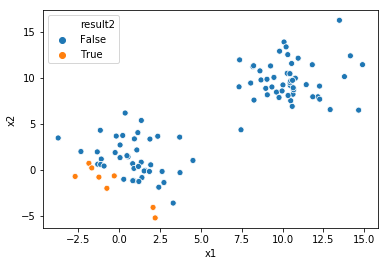

In [19]:
sns.scatterplot(x = "x1", y = "x2", hue = "result2", data = data_result)

In [96]:
def sigmoid(x):
    return 1/(1+np.exp(-x))

In [97]:
Wn = [1, 1, 1]


In [98]:
for i in range(100000):
    p = np.array(sigmoid(X.dot(Wn)), ndmin=2).T
    W = np.diag((p*(1-p))[:, 0])
    hessian = X.T.dot(W).dot(X) 
    grad = X.T.dot(np.array(Y)-p.reshape(-1, ))
    try:
        step = np.dot(np.linalg.inv(hessian), grad)
    except:
         step = np.dot(np.linalg.inv(hessian + 5*np.identity(3)), grad)
    Wn = Wn + step
    print("\n", i)
    print(Wn)


 0
[-9.62497019 -9.41492324 -9.53143863]

 1
[50524.17659979 50914.61536123 56728.26400312]

 2
[50515.77659979 50907.43688334 56717.99413268]

 3
[50507.37659979 50900.25840545 56707.72426224]

 4
[50498.97659979 50893.07992757 56697.45439181]

 5
[50490.57659979 50885.90144968 56687.18452137]

 6
[50482.17659979 50878.72297179 56676.91465093]

 7
[50473.77659979 50871.5444939  56666.6447805 ]

 8
[50465.37659979 50864.36601602 56656.37491006]

 9
[50456.97659979 50857.18753813 56646.10503962]

 10
[50448.57659979 50850.00906024 56635.83516919]

 11
[50440.17659979 50842.83058235 56625.56529875]

 12
[50431.77659979 50835.65210446 56615.29542831]

 13
[50423.37659979 50828.47362658 56605.02555788]

 14
[50414.97659979 50821.29514869 56594.75568744]

 15
[50406.57659979 50814.1166708  56584.485817  ]

 16
[50398.17659979 50806.93819291 56574.21594657]

 17
[50389.77659979 50799.75971503 56563.94607613]

 18
[50381.37659979 50792.58123714 56553.67620569]

 19
[50372.97659979 50785.4027

c:\users\chuck\desktop\python\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


 55
[50070.57659979 50526.9775553  56173.69099954]

 56
[50062.17659979 50519.79907741 56163.4211291 ]

 57
[50053.77659979 50512.62059952 56153.15125866]

 58
[50045.37659979 50505.44212163 56142.88138823]

 59
[50036.97659979 50498.26364375 56132.61151779]

 60
[50028.57659979 50491.08516586 56122.34164735]

 61
[50020.17659979 50483.90668797 56112.07177692]

 62
[50011.77659979 50476.72821008 56101.80190648]

 63
[50003.37659979 50469.5497322  56091.53203604]

 64
[49994.97659979 50462.37125431 56081.26216561]

 65
[49986.57659979 50455.19277642 56070.99229517]

 66
[49978.17659979 50448.01429853 56060.72242473]

 67
[49969.77659979 50440.83582064 56050.4525543 ]

 68
[49961.37659979 50433.65734276 56040.18268386]

 69
[49952.97659979 50426.47886487 56029.91281342]

 70
[49944.57659979 50419.30038698 56019.64294299]

 71
[49936.17659979 50412.12190909 56009.37307255]

 72
[49927.77659979 50404.94343121 55999.10320211]

 73
[49919.37659979 50397.76495332 55988.83333168]

 74
[49910.9


 228
[48617.37659979 49285.10088074 54397.003414  ]

 229
[48608.97659979 49277.92240285 54386.73354356]

 230
[48600.57659979 49270.74392496 54376.46367312]

 231
[48592.17659979 49263.56544707 54366.19380269]

 232
[48583.77659979 49256.38696919 54355.92393225]

 233
[48575.37659979 49249.2084913  54345.65406181]

 234
[48566.97659979 49242.03001341 54335.38419138]

 235
[48558.57659979 49234.85153552 54325.11432094]

 236
[48550.17659979 49227.67305764 54314.8444505 ]

 237
[48541.77659979 49220.49457975 54304.57458007]

 238
[48533.37659979 49213.31610186 54294.30470963]

 239
[48524.97659979 49206.13762397 54284.03483919]

 240
[48516.57659979 49198.95914608 54273.76496876]

 241
[48508.17659979 49191.7806682  54263.49509832]

 242
[48499.77659979 49184.60219031 54253.22522788]

 243
[48491.37659979 49177.42371242 54242.95535745]

 244
[48482.97659979 49170.24523453 54232.68548701]

 245
[48474.57659979 49163.06675665 54222.41561657]

 246
[48466.17659979 49155.88827876 54212.145

 394
[47222.97659979 48093.47355139 52692.20492151]

 395
[47214.57659979 48086.2950735  52681.93505107]

 396
[47206.17659979 48079.11659561 52671.66518064]

 397
[47197.77659979 48071.93811773 52661.3953102 ]

 398
[47189.37659979 48064.75963984 52651.12543976]

 399
[47180.97659979 48057.58116195 52640.85556933]

 400
[47172.57659979 48050.40268406 52630.58569889]

 401
[47164.17659979 48043.22420618 52620.31582845]

 402
[47155.77659979 48036.04572829 52610.04595802]

 403
[47147.37659979 48028.8672504  52599.77608758]

 404
[47138.97659979 48021.68877251 52589.50621714]

 405
[47130.57659979 48014.51029463 52579.23634671]

 406
[47122.17659979 48007.33181674 52568.96647627]

 407
[47113.77659979 48000.15333885 52558.69660583]

 408
[47105.37659979 47992.97486096 52548.4267354 ]

 409
[47096.97659979 47985.79638307 52538.15686496]

 410
[47088.57659979 47978.61790519 52527.88699452]

 411
[47080.17659979 47971.4394273  52517.61712409]

 412
[47071.77659979 47964.26094941 52507.3472


 577
[45685.77659979 46779.81209795 50812.8186316 ]

 578
[45677.37659979 46772.63362007 50802.54876117]

 579
[45668.97659979 46765.45514218 50792.27889073]

 580
[45660.57659979 46758.27666429 50782.00902029]

 581
[45652.17659979 46751.0981864  50771.73914986]

 582
[45643.77659979 46743.91970851 50761.46927942]

 583
[45635.37659979 46736.74123063 50751.19940898]

 584
[45626.97659979 46729.56275274 50740.92953855]

 585
[45618.57659979 46722.38427485 50730.65966811]

 586
[45610.17659979 46715.20579696 50720.38979767]

 587
[45601.77659979 46708.02731908 50710.11992724]

 588
[45593.37659979 46700.84884119 50699.8500568 ]

 589
[45584.97659979 46693.6703633  50689.58018636]

 590
[45576.57659979 46686.49188541 50679.31031593]

 591
[45568.17659979 46679.31340753 50669.04044549]

 592
[45559.77659979 46672.13492964 50658.77057505]

 593
[45551.37659979 46664.95645175 50648.50070462]

 594
[45542.97659979 46657.77797386 50638.23083418]

 595
[45534.57659979 46650.59949598 50627.960

 758
[44165.37659979 45480.50760029 48953.97208257]

 759
[44156.97659979 45473.3291224  48943.70221213]

 760
[44148.57659979 45466.15064452 48933.43234169]

 761
[44140.17659979 45458.97216663 48923.16247126]

 762
[44131.77659979 45451.79368874 48912.89260082]

 763
[44123.37659979 45444.61521085 48902.62273038]

 764
[44114.97659979 45437.43673297 48892.35285995]

 765
[44106.57659979 45430.25825508 48882.08298951]

 766
[44098.17659979 45423.07977719 48871.81311907]

 767
[44089.77659979 45415.9012993  48861.54324864]

 768
[44081.37659979 45408.72282142 48851.2733782 ]

 769
[44072.97659979 45401.54434353 48841.00350776]

 770
[44064.57659979 45394.36586564 48830.73363733]

 771
[44056.17659979 45387.18738775 48820.46376689]

 772
[44047.77659979 45380.00890986 48810.19389645]

 773
[44039.37659979 45372.83043198 48799.92402602]

 774
[44030.97659979 45365.65195409 48789.65415558]

 775
[44022.57659979 45358.4734762  48779.38428514]

 776
[44014.17659979 45351.29499831 48769.1144


 939
[42644.97659979 44181.20310263 47095.12553353]

 940
[42636.57659979 44174.02462474 47084.8556631 ]

 941
[42628.17659979 44166.84614685 47074.58579266]

 942
[42619.77659979 44159.66766897 47064.31592222]

 943
[42611.37659979 44152.48919108 47054.04605179]

 944
[42602.97659979 44145.31071319 47043.77618135]

 945
[42594.57659979 44138.1322353  47033.50631091]

 946
[42586.17659979 44130.95375742 47023.23644048]

 947
[42577.77659979 44123.77527953 47012.96657004]

 948
[42569.37659979 44116.59680164 47002.6966996 ]

 949
[42560.97659979 44109.41832375 46992.42682917]

 950
[42552.57659979 44102.23984587 46982.15695873]

 951
[42544.17659979 44095.06136798 46971.88708829]

 952
[42535.77659979 44087.88289009 46961.61721786]

 953
[42527.37659979 44080.7044122  46951.34734742]

 954
[42518.97659979 44073.52593432 46941.07747698]

 955
[42510.57659979 44066.34745643 46930.80760655]

 956
[42502.17659979 44059.16897854 46920.53773611]

 957
[42493.77659979 44051.99050065 46910.267


 1129
[41048.97659979 42817.29230398 45143.85015057]

 1130
[41040.57659979 42810.11382609 45133.58028013]

 1131
[41032.17659979 42802.9353482  45123.3104097 ]

 1132
[41023.77659979 42795.75687032 45113.04053926]

 1133
[41015.37659979 42788.57839243 45102.77066882]

 1134
[41006.97659979 42781.39991454 45092.50079839]

 1135
[40998.57659979 42774.22143665 45082.23092795]

 1136
[40990.17659979 42767.04295877 45071.96105751]

 1137
[40981.77659979 42759.86448088 45061.69118708]

 1138
[40973.37659979 42752.68600299 45051.42131664]

 1139
[40964.97659979 42745.5075251  45041.1514462 ]

 1140
[40956.57659979 42738.32904722 45030.88157577]

 1141
[40948.17659979 42731.15056933 45020.61170533]

 1142
[40939.77659979 42723.97209144 45010.34183489]

 1143
[40931.37659979 42716.79361355 45000.07196446]

 1144
[40922.97659979 42709.61513567 44989.80209402]

 1145
[40914.57659979 42702.43665778 44979.53222358]

 1146
[40906.17659979 42695.25817989 44969.26235315]

 1147
[40897.77659979 42688

 1306
[39562.17659979 41546.70171787 43326.08308328]

 1307
[39553.77659979 41539.52323998 43315.81321284]

 1308
[39545.37659979 41532.34476209 43305.54334241]

 1309
[39536.97659979 41525.16628421 43295.27347197]

 1310
[39528.57659979 41517.98780632 43285.00360153]

 1311
[39520.17659979 41510.80932843 43274.7337311 ]

 1312
[39511.77659979 41503.63085054 43264.46386066]

 1313
[39503.37659979 41496.45237266 43254.19399022]

 1314
[39494.97659979 41489.27389477 43243.92411979]

 1315
[39486.57659979 41482.09541688 43233.65424935]

 1316
[39478.17659979 41474.91693899 43223.38437891]

 1317
[39469.77659979 41467.73846111 43213.11450848]

 1318
[39461.37659979 41460.55998322 43202.84463804]

 1319
[39452.97659979 41453.38150533 43192.5747676 ]

 1320
[39444.57659979 41446.20302744 43182.30489717]

 1321
[39436.17659979 41439.02454955 43172.03502673]

 1322
[39427.77659979 41431.84607167 43161.76515629]

 1323
[39419.37659979 41424.66759378 43151.49528586]

 1324
[39410.97659979 41417.


 1494
[37982.97659979 40197.14787499 41395.34744119]

 1495
[37974.57659979 40189.96939711 41385.07757075]

 1496
[37966.17659979 40182.79091922 41374.80770032]

 1497
[37957.77659979 40175.61244133 41364.53782988]

 1498
[37949.37659979 40168.43396344 41354.26795944]

 1499
[37940.97659979 40161.25548556 41343.99808901]

 1500
[37932.57659979 40154.07700767 41333.72821857]

 1501
[37924.17659979 40146.89852978 41323.45834813]

 1502
[37915.77659979 40139.72005189 41313.1884777 ]

 1503
[37907.37659979 40132.54157401 41302.91860726]

 1504
[37898.97659979 40125.36309612 41292.64873682]

 1505
[37890.57659979 40118.18461823 41282.37886639]

 1506
[37882.17659979 40111.00614034 41272.10899595]

 1507
[37873.77659979 40103.82766246 41261.83912551]

 1508
[37865.37659979 40096.64918457 41251.56925508]

 1509
[37856.97659979 40089.47070668 41241.29938464]

 1510
[37848.57659979 40082.29222879 41231.0295142 ]

 1511
[37840.17659979 40075.1137509  41220.75964377]

 1512
[37831.77659979 40067

[36420.57659979 38861.95098789 39485.15153997]

 1681
[36412.17659979 38854.77251001 39474.88166953]

 1682
[36403.77659979 38847.59403212 39464.6117991 ]

 1683
[36395.37659979 38840.41555423 39454.34192866]

 1684
[36386.97659979 38833.23707634 39444.07205822]

 1685
[36378.57659979 38826.05859846 39433.80218779]

 1686
[36370.17659979 38818.88012057 39423.53231735]

 1687
[36361.77659979 38811.70164268 39413.26244691]

 1688
[36353.37659979 38804.52316479 39402.99257648]

 1689
[36344.97659979 38797.34468691 39392.72270604]

 1690
[36336.57659979 38790.16620902 39382.4528356 ]

 1691
[36328.17659979 38782.98773113 39372.18296517]

 1692
[36319.77659979 38775.80925324 39361.91309473]

 1693
[36311.37659979 38768.63077536 39351.64322429]

 1694
[36302.97659979 38761.45229747 39341.37335386]

 1695
[36294.57659979 38754.27381958 39331.10348342]

 1696
[36286.17659979 38747.09534169 39320.83361298]

 1697
[36277.77659979 38739.91686381 39310.56374255]

 1698
[36269.37659979 38732.738385

 1878
[34757.37659979 37440.61236614 37451.71719351]

 1879
[34748.97659979 37433.43388826 37441.44732308]

 1880
[34740.57659979 37426.25541037 37431.17745264]

 1881
[34732.17659979 37419.07693248 37420.9075822 ]

 1882
[34723.77659979 37411.89845459 37410.63771177]

 1883
[34715.37659979 37404.71997671 37400.36784133]

 1884
[34706.97659979 37397.54149882 37390.09797089]

 1885
[34698.57659979 37390.36302093 37379.82810046]

 1886
[34690.17659979 37383.18454304 37369.55823002]

 1887
[34681.77659979 37376.00606516 37359.28835958]

 1888
[34673.37659979 37368.82758727 37349.01848915]

 1889
[34664.97659979 37361.64910938 37338.74861871]

 1890
[34656.57659979 37354.47063149 37328.47874827]

 1891
[34648.17659979 37347.2921536  37318.20887784]

 1892
[34639.77659979 37340.11367572 37307.9390074 ]

 1893
[34631.37659979 37332.93519783 37297.66913696]

 1894
[34622.97659979 37325.75671994 37287.39926653]

 1895
[34614.57659979 37318.57824205 37277.12939609]

 1896
[34606.17659979 37311.


 2091
[32968.17659979 35911.59657608 35264.23479051]

 2092
[32959.77659979 35904.41809819 35253.96492007]

 2093
[32951.37659979 35897.2396203  35243.69504963]

 2094
[32942.97659979 35890.06114242 35233.4251792 ]

 2095
[32934.57659979 35882.88266453 35223.15530876]

 2096
[32926.17659979 35875.70418664 35212.88543832]

 2097
[32917.77659979 35868.52570875 35202.61556789]

 2098
[32909.37659979 35861.34723086 35192.34569745]

 2099
[32900.97659979 35854.16875298 35182.07582701]

 2100
[32892.57659979 35846.99027509 35171.80595658]

 2101
[32884.17659979 35839.8117972  35161.53608614]

 2102
[32875.77659979 35832.63331931 35151.2662157 ]

 2103
[32867.37659979 35825.45484143 35140.99634527]

 2104
[32858.97659979 35818.27636354 35130.72647483]

 2105
[32850.57659979 35811.09788565 35120.45660439]

 2106
[32842.17659979 35803.91940776 35110.18673396]

 2107
[32833.77659979 35796.74092988 35099.91686352]

 2108
[32825.37659979 35789.56245199 35089.64699308]

 2109
[32816.97659979 35782


 2309
[31136.97659979 34346.68839657 33025.40303531]

 2310
[31128.57659979 34339.50991869 33015.13316488]

 2311
[31120.17659979 34332.3314408  33004.86329444]

 2312
[31111.77659979 34325.15296291 32994.593424  ]

 2313
[31103.37659979 34317.97448502 32984.32355357]

 2314
[31094.97659979 34310.79600714 32974.05368313]

 2315
[31086.57659979 34303.61752925 32963.78381269]

 2316
[31078.17659979 34296.43905136 32953.51394226]

 2317
[31069.77659979 34289.26057347 32943.24407182]

 2318
[31061.37659979 34282.08209559 32932.97420138]

 2319
[31052.97659979 34274.9036177  32922.70433095]

 2320
[31044.57659979 34267.72513981 32912.43446051]

 2321
[31036.17659979 34260.54666192 32902.16459007]

 2322
[31027.77659979 34253.36818404 32891.89471964]

 2323
[31019.37659979 34246.18970615 32881.6248492 ]

 2324
[31010.97659979 34239.01122826 32871.35497876]

 2325
[31002.57659979 34231.83275037 32861.08510833]

 2326
[30994.17659979 34224.65427248 32850.81523789]

 2327
[30985.77659979 34217

 2512
[29431.77659979 32889.45738539 30940.61933667]

 2513
[29423.37659979 32882.2789075  30930.34946624]

 2514
[29414.97659979 32875.10042961 30920.0795958 ]

 2515
[29406.57659979 32867.92195172 30909.80972536]

 2516
[29398.17659979 32860.74347383 30899.53985493]

 2517
[29389.77659979 32853.56499595 30889.26998449]

 2518
[29381.37659979 32846.38651806 30879.00011405]

 2519
[29372.97659979 32839.20804017 30868.73024362]

 2520
[29364.57659979 32832.02956228 30858.46037318]

 2521
[29356.17659979 32824.8510844  30848.19050274]

 2522
[29347.77659979 32817.67260651 30837.92063231]

 2523
[29339.37659979 32810.49412862 30827.65076187]

 2524
[29330.97659979 32803.31565073 30817.38089143]

 2525
[29322.57659979 32796.13717285 30807.111021  ]

 2526
[29314.17659979 32788.95869496 30796.84115056]

 2527
[29305.77659979 32781.78021707 30786.57128012]

 2528
[29297.37659979 32774.60173918 30776.30140969]

 2529
[29288.97659979 32767.4232613  30766.03153925]

 2530
[29280.57659979 32760.

 2678
[28037.37659979 31697.83005604 29235.82084419]

 2679
[28028.97659979 31690.65157815 29225.55097375]

 2680
[28020.57659979 31683.47310026 29215.28110332]

 2681
[28012.17659979 31676.29462238 29205.01123288]

 2682
[28003.77659979 31669.11614449 29194.74136244]

 2683
[27995.37659979 31661.9376666  29184.47149201]

 2684
[27986.97659979 31654.75918871 29174.20162157]

 2685
[27978.57659979 31647.58071082 29163.93175113]

 2686
[27970.17659979 31640.40223294 29153.6618807 ]

 2687
[27961.77659979 31633.22375505 29143.39201026]

 2688
[27953.37659979 31626.04527716 29133.12213982]

 2689
[27944.97659979 31618.86679927 29122.85226939]

 2690
[27936.57659979 31611.68832139 29112.58239895]

 2691
[27928.17659979 31604.5098435  29102.31252851]

 2692
[27919.77659979 31597.33136561 29092.04265808]

 2693
[27911.37659979 31590.15288772 29081.77278764]

 2694
[27902.97659979 31582.97440984 29071.5029172 ]

 2695
[27894.57659979 31575.79593195 29061.23304677]

 2696
[27886.17659979 31568.

[26642.97659979 30506.20272669 27531.02235171]

 2845
[26634.57659979 30499.0242488  27520.75248127]

 2846
[26626.17659979 30491.84577092 27510.48261083]

 2847
[26617.77659979 30484.66729303 27500.2127404 ]

 2848
[26609.37659979 30477.48881514 27489.94286996]

 2849
[26600.97659979 30470.31033725 27479.67299952]

 2850
[26592.57659979 30463.13185937 27469.40312909]

 2851
[26584.17659979 30455.95338148 27459.13325865]

 2852
[26575.77659979 30448.77490359 27448.86338821]

 2853
[26567.37659979 30441.5964257  27438.59351778]

 2854
[26558.97659979 30434.41794782 27428.32364734]

 2855
[26550.57659979 30427.23946993 27418.0537769 ]

 2856
[26542.17659979 30420.06099204 27407.78390647]

 2857
[26533.77659979 30412.88251415 27397.51403603]

 2858
[26525.37659979 30405.70403626 27387.24416559]

 2859
[26516.97659979 30398.52555838 27376.97429516]

 2860
[26508.57659979 30391.34708049 27366.70442472]

 2861
[26500.17659979 30384.1686026  27356.43455428]

 2862
[26491.77659979 30376.990124

 3011
[25240.17659979 29307.39691946 25815.95398878]

 3012
[25231.77659979 29300.21844157 25805.68411835]

 3013
[25223.37659979 29293.03996368 25795.41424791]

 3014
[25214.97659979 29285.86148579 25785.14437747]

 3015
[25206.57659979 29278.68300791 25774.87450704]

 3016
[25198.17659979 29271.50453002 25764.6046366 ]

 3017
[25189.77659979 29264.32605213 25754.33476616]

 3018
[25181.37659979 29257.14757424 25744.06489573]

 3019
[25172.97659979 29249.96909636 25733.79502529]

 3020
[25164.57659979 29242.79061847 25723.52515485]

 3021
[25156.17659979 29235.61214058 25713.25528442]

 3022
[25147.77659979 29228.43366269 25702.98541398]

 3023
[25139.37659979 29221.25518481 25692.71554354]

 3024
[25130.97659979 29214.07670692 25682.44567311]

 3025
[25122.57659979 29206.89822903 25672.17580267]

 3026
[25114.17659979 29199.71975114 25661.90593223]

 3027
[25105.77659979 29192.54127325 25651.6360618 ]

 3028
[25097.37659979 29185.36279537 25641.36619136]

 3029
[25088.97659979 29178.

 3177
[23845.77659979 28115.76959011 24111.1554963 ]

 3178
[23837.37659979 28108.59111222 24100.88562586]

 3179
[23828.97659979 28101.41263433 24090.61575543]

 3180
[23820.57659979 28094.23415645 24080.34588499]

 3181
[23812.17659979 28087.05567856 24070.07601455]

 3182
[23803.77659979 28079.87720067 24059.80614412]

 3183
[23795.37659979 28072.69872278 24049.53627368]

 3184
[23786.97659979 28065.5202449  24039.26640324]

 3185
[23778.57659979 28058.34176701 24028.99653281]

 3186
[23770.17659979 28051.16328912 24018.72666237]

 3187
[23761.77659979 28043.98481123 24008.45679193]

 3188
[23753.37659979 28036.80633335 23998.1869215 ]

 3189
[23744.97659979 28029.62785546 23987.91705106]

 3190
[23736.57659979 28022.44937757 23977.64718062]

 3191
[23728.17659979 28015.27089968 23967.37731019]

 3192
[23719.77659979 28008.0924218  23957.10743975]

 3193
[23711.37659979 28000.91394391 23946.83756931]

 3194
[23702.97659979 27993.73546602 23936.56769888]

 3195
[23694.57659979 27986.

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3344
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3345
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3346
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3347
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3348
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3349
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3350
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3351
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3352
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3353
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3354
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3355
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3356
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3357
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3358
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3359
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3360
[-1.41725678e+19  3.03844315e+1


 3509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3516
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3517
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3518
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3519
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3520
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3521
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3522
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3523
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3524
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3525
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3526
[-1.41725678e+19  3.0384


 3670
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3671
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3672
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3677
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3685
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3686
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3687
[-1.41725678e+19  3.0384

 3837
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3838
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3839
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3840
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3841
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3842
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3843
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3844
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3845
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3846
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3847
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3848
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3849
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3850
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3851
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3852
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3853
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 3854
[-1.41725678e+19  3.03844

 4001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4004
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4005
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4006
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4007
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4008
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4009
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4010
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4011
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4012
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4013
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4014
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4015
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4016
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4017
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4018
[-1.41725678e+19  3.03844


 4170
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4171
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4172
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4176
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4177
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4178
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4179
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4180
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4181
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4182
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4183
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4184
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4185
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4186
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4187
[-1.41725678e+19  3.0384

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4342
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4343
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4344
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4345
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4346
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4347
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4348
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4349
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4350
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4351
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4352
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4353
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4354
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4355
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4356
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4357
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4358
[-1.41725678e+19  3.03844315e+1

 4508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4516
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4517
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4518
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4519
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4520
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4521
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4522
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4523
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4524
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4525
[-1.41725678e+19  3.03844

 4674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4677
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4685
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4686
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4687
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4688
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4689
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4690
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4691
[-1.41725678e+19  3.03844

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4841
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4842
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4843
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4844
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4845
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4846
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4847
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4848
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4849
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4850
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4851
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4852
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4853
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4854
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4855
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4856
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 4857
[-1.41725678e+19  3.03844315e+1

 5007
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5008
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5009
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5010
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5011
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5012
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5013
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5014
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5015
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5016
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5017
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5018
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5019
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5020
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5021
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5022
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5023
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5024
[-1.41725678e+19  3.03844

 5173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5176
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5177
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5178
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5179
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5180
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5181
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5182
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5183
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5184
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5185
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5186
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5187
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5188
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5189
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5190
[-1.41725678e+19  3.03844

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5340
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5341
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5342
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5343
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5344
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5345
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5346
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5347
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5348
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5349
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5350
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5351
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5352
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5353
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5354
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5355
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5356
[-1.41725678e+19  3.03844315e+1

 5506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5516
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5517
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5518
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5519
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5520
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5521
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5522
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5523
[-1.41725678e+19  3.03844

 5672
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5677
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5685
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5686
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5687
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5688
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5689
[-1.41725678e+19  3.03844

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5839
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5840
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5841
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5842
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5843
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5844
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5845
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5846
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5847
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5848
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5849
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5850
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5851
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5852
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5853
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5854
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 5855
[-1.41725678e+19  3.03844315e+1

 6005
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6006
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6007
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6008
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6009
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6010
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6011
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6012
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6013
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6014
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6015
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6016
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6017
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6018
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6019
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6020
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6021
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6022
[-1.41725678e+19  3.03844

 6171
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6172
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6176
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6177
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6178
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6179
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6180
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6181
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6182
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6183
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6184
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6185
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6186
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6187
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6188
[-1.41725678e+19  3.03844

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6338
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6339
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6340
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6341
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6342
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6343
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6344
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6345
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6346
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6347
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6348
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6349
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6350
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6351
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6352
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6353
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6354
[-1.41725678e+19  3.03844315e+1

 6504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6516
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6517
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6518
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6519
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6520
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6521
[-1.41725678e+19  3.03844

 6670
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6671
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6672
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6677
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6685
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6686
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6687
[-1.41725678e+19  3.03844

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6837
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6838
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6839
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6840
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6841
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6842
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6843
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6844
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6845
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6846
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6847
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6848
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6849
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6850
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6851
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6852
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 6853
[-1.41725678e+19  3.03844315e+1

 7003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7004
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7005
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7006
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7007
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7008
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7009
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7010
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7011
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7012
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7013
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7014
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7015
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7016
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7017
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7018
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7019
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7020
[-1.41725678e+19  3.03844

 7169
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7170
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7171
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7172
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7176
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7177
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7178
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7179
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7180
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7181
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7182
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7183
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7184
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7185
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7186
[-1.41725678e+19  3.03844

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7336
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7337
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7338
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7339
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7340
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7341
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7342
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7343
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7344
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7345
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7346
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7347
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7348
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7349
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7350
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7351
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7352
[-1.41725678e+19  3.03844315e+1

 7502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7516
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7517
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7518
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7519
[-1.41725678e+19  3.03844

 7668
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7669
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7670
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7671
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7672
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7677
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7685
[-1.41725678e+19  3.03844

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7835
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7836
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7837
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7838
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7839
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7840
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7841
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7842
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7843
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7844
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7845
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7846
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7847
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7848
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7849
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7850
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 7851
[-1.41725678e+19  3.03844315e+1


 8070
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8071
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8072
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8073
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8074
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8075
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8076
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8077
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8078
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8079
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8080
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8081
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8082
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8083
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8084
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8085
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8086
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8087
[-1.41725678e+19  3.0384

 8289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8306
[-1.41725678e+19  3.03844

 8500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8516
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8517
[-1.41725678e+19  3.03844

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8667
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8668
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8669
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8670
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8671
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8672
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8677
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8683
[-1.41725678e+19  3.03844315e+1

 8810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8827
[-1.41725678e+19  3.03844


 8958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 8975
[-1.41725678e+19  3.0384

 9166
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9167
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9168
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9169
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9170
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9171
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9172
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9176
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9177
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9178
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9179
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9180
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9181
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9182
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9183
[-1.41725678e+19  3.03844


 9315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9332
[-1.41725678e+19  3.0384


 9499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9516
[-1.41725678e+19  3.0384

 9665
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9666
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9667
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9668
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9669
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9670
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9671
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9672
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9677
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9682
[-1.41725678e+19  3.03844

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9833
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9834
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9835
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9836
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9837
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9838
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9839
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9840
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9841
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9842
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9843
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9844
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9845
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9846
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9847
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9848
[-1.41725678e+19  3.03844315e+1


 9987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 9999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10004
[-1.41725678e+19  3

 10164
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10165
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10166
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10167
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10168
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10169
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10170
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10171
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10172
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10176
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10177
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10178
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10179
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10180
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10181
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10332
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10333
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10334
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10335
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10336
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10337
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10338
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10339
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10340
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10341
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10342
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10343
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10344
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10345
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10346
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10347
[-1.41725678e+

 10497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10514
[-1.417


 10777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10794
[-1.41

 10996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 10999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11004
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11005
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11006
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11007
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11008
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11009
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11010
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11011
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11012
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11013
[-1.417


 11148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11162
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11163
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11164
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11165
[-1.41

 11322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11332
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11333
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11334
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11335
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11336
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11337
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11338
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11339
[-1.417


 11597
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11598
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11599
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11600
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11601
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11602
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11604
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11614
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11833
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11834
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11835
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11836
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11837
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11838
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11839
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11840
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11841
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11842
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11843
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11844
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11845
[-1.41725678e+

 11995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 11999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12004
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12005
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12006
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12007
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12008
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12009
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12010
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12011
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12012
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12162
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12163
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12164
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12165
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12166
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12167
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12168
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12169
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12170
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12171
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12172
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12176
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12177
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12178
[-1.41725678e+

 12328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12332
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12333
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12334
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12335
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12336
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12337
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12338
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12339
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12340
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12341
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12342
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12343
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12344
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12345
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12496
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12511
[-1.41725678e+


 12660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12661
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12662
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12663
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12664
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12665
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12666
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12667
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12668
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12669
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12670
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12671
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12672
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12677
[-1.41

 12976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 12993
[-1.417

 13135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13152
[-1.417


 13315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13332
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13496
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13510
[-1.41725678e+


 13646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13661
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13662
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13663
[-1.41

 13826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13833
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13834
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13835
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13836
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13837
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13838
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13839
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13840
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13841
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13842
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13843
[-1.417


 13979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 13996
[-1.41


 14121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14138
[-1.41


 14326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14332
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14333
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14334
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14335
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14336
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14337
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14338
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14339
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14340
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14341
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14342
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14343
[-1.41

 14492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14496
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14509
[-1.417


 14659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14661
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14662
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14663
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14664
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14665
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14666
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14667
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14668
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14669
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14670
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14671
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14672
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14676
[-1.41

 14825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14833
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14834
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14835
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14836
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14837
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14838
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14839
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14840
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14841
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14842
[-1.417


 14976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 14993
[-1.41


 15139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15156
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15307
[-1.41725678e+

 15443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15460
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15661
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15662
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15663
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15664
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15665
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15666
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15667
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15668
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15669
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15670
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15671
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15672
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15674
[-1.41725678e+

 15824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15833
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15834
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15835
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15836
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15837
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15838
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15839
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15840
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15841
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 15999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16004
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16005
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16006
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16007
[-1.41725678e+


 16139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16156
[-1.41


 16453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16470
[-1.41


 16644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16661
[-1.41

 16819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16833
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16834
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16835
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16836
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 16999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17004
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17005
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17006
[-1.41725678e+


 17311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17328
[-1.41

 17489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17496
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17506
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17661
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17662
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17663
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17664
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17665
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17666
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17667
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17668
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17669
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17670
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17671
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17672
[-1.41725678e+


 17816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17833
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 17999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18004
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18005
[-1.41725678e+

 18135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18152
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18332
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18333
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18334
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18335
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18336
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18337
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18338
[-1.41725678e+


 18636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18653
[-1.41

 18821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18833
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18834
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18835
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18836
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18837
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18838
[-1.417

 18971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 18988
[-1.417


 19118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19135
[-1.41

 19320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19332
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19333
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19334
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19335
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19336
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19337
[-1.417


 19630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19647
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19833
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19834
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19835
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19836
[-1.41725678e+

 19986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 19999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20003
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20162
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20163
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20164
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20165
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20166
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20167
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20168
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20169
[-1.41725678e+

 20319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20332
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20333
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20334
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20335
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20336
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20496
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20502
[-1.41725678e+


 20649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20661
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20662
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20663
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20664
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20665
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20666
[-1.41


 20815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20832
[-1.41

 20985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 20999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21002
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21162
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21163
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21164
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21165
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21166
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21167
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21168
[-1.41725678e+

 21318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21332
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21333
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21334
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21335
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21496
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21501
[-1.41725678e+

 21651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21661
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21662
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21663
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21664
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21665
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21666
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21667
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21668
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21833
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21834
[-1.41725678e+

 21984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 21999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22001
[-1.417


 22126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22143
[-1.41


 22313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22330
[-1.41


 22471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22488
[-1.41

 22650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22661
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22662
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22663
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22664
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22665
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22666
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22667
[-1.417

 22816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22828
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22829
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22830
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22831
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22832
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 22833
[-1.417


 23065
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23066
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23067
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23068
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23069
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23070
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23071
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23072
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23073
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23074
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23075
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23076
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23077
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23078
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23079
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23080
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23081
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23082
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23332
[-1.41725678e+

 23465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23482
[-1.417


 23611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23628
[-1.41


 23781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23798
[-1.41

 23948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 23965
[-1.417


 24148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24162
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24163
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24164
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24165
[-1.41

 24314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24331
[-1.417


 24463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24480
[-1.41

 24634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24651
[-1.417

 24804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24821
[-1.417

 24980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 24997
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25162
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25163
[-1.41725678e+

 25313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25329
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25330
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25496
[-1.41725678e+

 25639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25656
[-1.417


 25787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25804
[-1.41

 25957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 25974
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26162
[-1.41725678e+

 26312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26329
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26495
[-1.41725678e+

 26645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26661
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26662
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26828
[-1.41725678e+

 26978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 26995
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27161
[-1.41725678e+

 27311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27328
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27494
[-1.41725678e+

 27644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27660
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27661
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27827
[-1.41725678e+

 27977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 27994
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28160
[-1.41725678e+

 28310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28327
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28493
[-1.41725678e+

 28643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28659
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28660
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28826
[-1.41725678e+

 28976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 28993
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29159
[-1.41725678e+

 29309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29326
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29492
[-1.41725678e+

 29642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29658
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29659
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29825
[-1.41725678e+

 29975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 29992
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30158
[-1.41725678e+

 30308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30325
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30491
[-1.41725678e+

 30641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30657
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30658
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30824
[-1.41725678e+

 30974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 30991
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31157
[-1.41725678e+

 31307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31324
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31490
[-1.41725678e+

 31640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31656
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31657
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31823
[-1.41725678e+

 31973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 31990
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32156
[-1.41725678e+

 32306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32323
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32489
[-1.41725678e+

 32639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32655
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32656
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32822
[-1.41725678e+

 32972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 32989
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33155
[-1.41725678e+

 33305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33322
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33488
[-1.41725678e+

 33638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33654
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33655
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33821
[-1.41725678e+

 33971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 33988
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34154
[-1.41725678e+

 34304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34321
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34487
[-1.41725678e+

 34637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34653
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34654
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34820
[-1.41725678e+

 34970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 34987
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35153
[-1.41725678e+

 35303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35320
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35486
[-1.41725678e+

 35636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35652
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35653
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35819
[-1.41725678e+

 35969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 35986
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36152
[-1.41725678e+

 36302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36319
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36484
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36485
[-1.41725678e+

 36635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36652
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36818
[-1.41725678e+

 36968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 36985
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37151
[-1.41725678e+

 37301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37318
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37483
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37484
[-1.41725678e+

 37634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37651
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37817
[-1.41725678e+

 37967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 37984
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38150
[-1.41725678e+

 38300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38317
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38482
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38483
[-1.41725678e+

 38633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38650
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38816
[-1.41725678e+

 38966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 38983
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39149
[-1.41725678e+

 39299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39316
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39481
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39482
[-1.41725678e+

 39632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39649
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39815
[-1.41725678e+

 39965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 39982
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40148
[-1.41725678e+

 40298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40315
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40480
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40481
[-1.41725678e+

 40631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40648
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40814
[-1.41725678e+

 40964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 40981
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41147
[-1.41725678e+

 41297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41314
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41479
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41480
[-1.41725678e+

 41630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41647
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41813
[-1.41725678e+

 41963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 41980
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42146
[-1.41725678e+

 42296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42313
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42478
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42479
[-1.41725678e+

 42629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42646
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42812
[-1.41725678e+

 42962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 42979
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43145
[-1.41725678e+

 43295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43312
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43477
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43478
[-1.41725678e+

 43628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43645
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43811
[-1.41725678e+

 43961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 43978
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44144
[-1.41725678e+

 44294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44311
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44476
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44477
[-1.41725678e+

 44627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44644
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44810
[-1.41725678e+

 44960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 44977
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45143
[-1.41725678e+

 45293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45310
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45475
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45476
[-1.41725678e+

 45626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45643
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45809
[-1.41725678e+

 45959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 45976
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46142
[-1.41725678e+

 46292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46309
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46474
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46475
[-1.41725678e+

 46625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46642
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46808
[-1.41725678e+

 46958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 46975
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47141
[-1.41725678e+

 47291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47308
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47473
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47474
[-1.41725678e+

 47624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47641
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47807
[-1.41725678e+

 47957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 47974
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48140
[-1.41725678e+

 48290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48307
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48472
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48473
[-1.41725678e+

 48623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48640
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48806
[-1.41725678e+

 48956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 48973
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49139
[-1.41725678e+

 49289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49306
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49471
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49472
[-1.41725678e+

 49622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49639
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49805
[-1.41725678e+

 49955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 49972
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50138
[-1.41725678e+

 50288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50305
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50471
[-1.41725678e+

 50621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50638
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50804
[-1.41725678e+

 50954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 50971
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51137
[-1.41725678e+

 51287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51304
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51470
[-1.41725678e+

 51620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51637
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51803
[-1.41725678e+

 51953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51969
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 51970
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52136
[-1.41725678e+

 52286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52303
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52469
[-1.41725678e+

 52619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52636
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52802
[-1.41725678e+

 52952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52968
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 52969
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53135
[-1.41725678e+

 53285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53302
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53468
[-1.41725678e+

 53618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53634
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53635
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53801
[-1.41725678e+

 53951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53967
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 53968
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54134
[-1.41725678e+

 54284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54301
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54467
[-1.41725678e+

 54617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54633
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54634
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54800
[-1.41725678e+

 54950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54966
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 54967
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55133
[-1.41725678e+

 55283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55300
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55466
[-1.41725678e+

 55616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55632
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55633
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55799
[-1.41725678e+

 55949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 55966
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56132
[-1.41725678e+

 56282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56299
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56465
[-1.41725678e+

 56615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56631
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56632
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56798
[-1.41725678e+

 56948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 56965
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57130
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57131
[-1.41725678e+

 57281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57298
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57464
[-1.41725678e+

 57614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57631
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57797
[-1.41725678e+

 57947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 57964
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58129
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58130
[-1.41725678e+

 58280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58297
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58463
[-1.41725678e+

 58613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58630
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58796
[-1.41725678e+

 58946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 58963
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59128
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59129
[-1.41725678e+

 59279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59296
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59462
[-1.41725678e+

 59612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59629
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59795
[-1.41725678e+

 59945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 59962
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60127
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60128
[-1.41725678e+

 60278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60295
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60461
[-1.41725678e+

 60611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60628
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60794
[-1.41725678e+

 60944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 60961
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61126
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61127
[-1.41725678e+

 61277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61294
[-1.417


 61446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61463
[-1.41

 61610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61627
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61793
[-1.41725678e+

 61943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 61960
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62125
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62126
[-1.41725678e+

 62276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62293
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62459
[-1.41725678e+

 62609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62626
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62792
[-1.41725678e+

 62942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 62959
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63124
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63125
[-1.41725678e+

 63275
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63292
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63458
[-1.41725678e+

 63608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63625
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63791
[-1.41725678e+

 63941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 63958
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64108
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64123
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64124
[-1.41725678e+

 64274
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64275
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64290
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64291
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64457
[-1.41725678e+

 64607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64624
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64789
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64790
[-1.41725678e+

 64940
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 64957
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65107
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65108
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65122
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65123
[-1.41725678e+

 65273
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65274
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65275
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65289
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65290
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65440
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65456
[-1.41725678e+

 65606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65623
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65788
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65789
[-1.41725678e+

 65939
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65940
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 65956
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66106
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66107
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66108
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66121
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66122
[-1.41725678e+

 66272
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66273
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66274
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66275
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66287
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66288
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66289
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66439
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66440
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66455
[-1.41725678e+

 66605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66622
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66788
[-1.41725678e+

 66938
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66939
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66940
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 66955
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67105
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67106
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67107
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67108
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67120
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67121
[-1.41725678e+


 67299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67316
[-1.41


 67454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67469
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67470
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67471
[-1.41


 67614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67630
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67631
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67787
[-1.41725678e+

 67937
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67938
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67939
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67940
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 67954
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68104
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68105
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68106
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68107
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68108
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68119
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68120
[-1.41725678e+

 68270
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68271
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68272
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68273
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68274
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68275
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68286
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68287
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68437
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68438
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68439
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68440
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68453
[-1.41725678e+

 68603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68604
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68620
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68786
[-1.41725678e+

 68936
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68937
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68938
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68939
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68940
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 68953
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69103
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69104
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69105
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69106
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69107
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69108
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69118
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69119
[-1.41725678e+

 69269
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69270
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69271
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69272
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69273
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69274
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69275
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69285
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69286
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69436
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69437
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69438
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69439
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69440
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69452
[-1.41725678e+

 69602
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69604
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69619
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69785
[-1.41725678e+

 69935
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69936
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69937
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69938
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69939
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69940
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 69952
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70102
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70103
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70104
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70105
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70106
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70107
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70108
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70117
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70118
[-1.41725678e+

 70268
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70269
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70270
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70271
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70272
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70273
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70274
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70275
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70284
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70285
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70435
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70436
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70437
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70438
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70439
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70440
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70451
[-1.41725678e+

 70601
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70602
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70604
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70618
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70768
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70784
[-1.41725678e+

 70934
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70935
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70936
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70937
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70938
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70939
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70940
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 70951
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71101
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71102
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71103
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71104
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71105
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71106
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71107
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71108
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71115
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71116
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71117
[-1.41725678e+

 71267
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71268
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71269
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71270
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71271
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71272
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71273
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71274
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71275
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71280
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71281
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71282
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71283
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71284
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71434
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71435
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71436
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71437
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71438
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71439
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71440
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71450
[-1.41725678e+

 71600
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71601
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71602
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71604
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71617
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71767
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71768
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71783
[-1.41725678e+


 71948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 71965
[-1.41


 72131
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72132
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72133
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72134
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72135
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72136
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72137
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72138
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72139
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72140
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72141
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72142
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72148
[-1.41


 72304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72321
[-1.41

 72499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72504
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72505
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72506
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72507
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72516
[-1.417

 72678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72685
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72686
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72687
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72688
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72689
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72690
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72691
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72692
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72693
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72694
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72695
[-1.417


 72853
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72854
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72855
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72856
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72857
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72858
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72859
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72860
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72861
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72862
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72863
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72864
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72865
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72866
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72867
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72868
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72869
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 72870
[-1.41


 73026
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73027
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73028
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73029
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73030
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73031
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73032
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73033
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73034
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73035
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73036
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73037
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73038
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73039
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73040
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73041
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73042
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73043
[-1.41

 73208
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73209
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73210
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73211
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73212
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73213
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73214
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73215
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73216
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73217
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73218
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73219
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73220
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73221
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73222
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73223
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73224
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73225
[-1.417


 73371
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73372
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73373
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73374
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73375
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73376
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73377
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73378
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73379
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73380
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73381
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73382
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73383
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73384
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73385
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73386
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73387
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73388
[-1.41

 73587
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73588
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73589
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73590
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73591
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73592
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73593
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73594
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73595
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73596
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73597
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73598
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73599
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73600
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73601
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73602
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73604
[-1.417


 73765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73766
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73767
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73768
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73782
[-1.41

 73931
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73932
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73933
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73934
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73935
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73936
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73937
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73938
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73939
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73940
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 73948
[-1.417


 74098
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74099
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74100
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74101
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74102
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74103
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74104
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74105
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74106
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74107
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74108
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74109
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74110
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74111
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74112
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74113
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74114
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74115
[-1.41


 74292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74309
[-1.41


 74485
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74496
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74502
[-1.41

 74680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74685
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74686
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74687
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74688
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74689
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74690
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74691
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74692
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74693
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74694
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74695
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74696
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74697
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74875
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74876
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74877
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74878
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74879
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74880
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74881
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74882
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74883
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74884
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74885
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74886
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74887
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74888
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74889
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74890
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 74891
[-1.41725678e+


 75064
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75065
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75066
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75067
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75068
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75069
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75070
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75071
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75072
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75073
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75074
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75075
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75076
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75077
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75078
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75079
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75080
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75081
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75264
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75265
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75266
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75267
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75268
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75269
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75270
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75271
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75272
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75273
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75274
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75275
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75276
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75277
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75278
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75279
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75280
[-1.41725678e+

 75430
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75431
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75432
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75433
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75434
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75435
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75436
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75437
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75438
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75439
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75440
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75447
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75597
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75598
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75599
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75600
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75601
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75602
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75604
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75612
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75613
[-1.41725678e+

 75790
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75791
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 75807
[-1.417


 76008
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76009
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76010
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76011
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76012
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76013
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76014
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76015
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76016
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76017
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76018
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76019
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76020
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76021
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76022
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76023
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76024
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76025
[-1.41

 76202
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76203
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76204
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76205
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76206
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76207
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76208
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76209
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76210
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76211
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76212
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76213
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76214
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76215
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76216
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76217
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76218
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76219
[-1.417

 76425
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76426
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76427
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76428
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76429
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76430
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76431
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76432
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76433
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76434
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76435
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76436
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76437
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76438
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76439
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76440
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76442
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76596
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76597
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76598
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76599
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76600
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76601
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76602
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76604
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76610
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76611
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76612
[-1.41725678e+

 76762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76766
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76767
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76768
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76779
[-1.417


 76949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76963
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76964
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76965
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 76966
[-1.41


 77159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77162
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77163
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77164
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77165
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77166
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77167
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77168
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77169
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77170
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77171
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77172
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77176
[-1.41

 77330
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77331
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77332
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77333
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77334
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77335
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77336
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77337
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77338
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77339
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77340
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77341
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77342
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77343
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77344
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77345
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77346
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77347
[-1.417

 77558
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77559
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77560
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77561
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77562
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77563
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77564
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77565
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77566
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77567
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77568
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77569
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77570
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77571
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77572
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77573
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77574
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77575
[-1.417

 77761
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77766
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77767
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77768
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77778
[-1.417

 77933
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77934
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77935
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77936
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77937
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77938
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77939
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77940
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77941
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77942
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77943
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77944
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77945
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 77950
[-1.417


 78154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78162
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78163
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78164
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78165
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78166
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78167
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78168
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78169
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78170
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78171
[-1.41


 78351
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78352
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78353
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78354
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78355
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78356
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78357
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78358
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78359
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78360
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78361
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78362
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78363
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78364
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78365
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78366
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78367
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78368
[-1.41


 78562
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78563
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78564
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78565
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78566
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78567
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78568
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78569
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78570
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78571
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78572
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78573
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78574
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78575
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78576
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78577
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78578
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78579
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78761
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78766
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78767
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78768
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78777
[-1.41725678e+


 78946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 78963
[-1.41


 79160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79162
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79163
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79164
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79165
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79166
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79167
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79168
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79169
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79170
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79171
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79172
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79176
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79177
[-1.41

 79377
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79378
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79379
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79380
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79381
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79382
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79383
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79384
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79385
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79386
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79387
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79388
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79389
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79390
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79391
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79392
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79393
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79394
[-1.417

 79593
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79594
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79595
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79596
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79597
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79598
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79599
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79600
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79601
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79602
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79604
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79609
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79610
[-1.417


 79762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79766
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79767
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79768
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79779
[-1.41


 79970
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79971
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79972
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79973
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79974
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79975
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79976
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79977
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79978
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79979
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79980
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79981
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79982
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79983
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79984
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79985
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79986
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 79987
[-1.41


 80185
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80186
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80187
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80188
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80189
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80190
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80191
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80192
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80193
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80194
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80195
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80196
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80197
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80198
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80199
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80200
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80201
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80202
[-1.41


 80346
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80347
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80348
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80349
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80350
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80351
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80352
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80353
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80354
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80355
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80356
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80357
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80358
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80359
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80360
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80361
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80362
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80363
[-1.41

 80592
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80593
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80594
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80595
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80596
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80597
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80598
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80599
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80600
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80601
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80602
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80603
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80604
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80605
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80606
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80607
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80608
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80609
[-1.417

 80811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80824
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80825
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80826
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80827
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 80828
[-1.417

 81030
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81031
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81032
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81033
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81034
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81035
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81036
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81037
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81038
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81039
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81040
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81041
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81042
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81043
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81044
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81045
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81046
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81047
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81259
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81260
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81261
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81262
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81263
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81264
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81265
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81266
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81267
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81268
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81269
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81270
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81271
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81272
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81273
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81274
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81275
[-1.41725678e+


 81452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81455
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81456
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81457
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81458
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81459
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81460
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81461
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81462
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81463
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81464
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81465
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81466
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81467
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81468
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81469
[-1.41


 81673
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81674
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81677
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81685
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81686
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81687
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81688
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81689
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81690
[-1.41


 81890
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81891
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81892
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81893
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81894
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81895
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81896
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81897
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81898
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81899
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81900
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81901
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81902
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81903
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81904
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81905
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81906
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 81907
[-1.41

 82091
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82092
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82093
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82094
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82095
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82096
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82097
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82098
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82099
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82100
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82101
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82102
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82103
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82104
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82105
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82106
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82107
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82108
[-1.417


 82312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82323
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82324
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82325
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82326
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82327
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82328
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82329
[-1.41

 82566
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82567
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82568
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82569
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82570
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82571
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82572
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82573
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82574
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82575
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82576
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82577
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82578
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82579
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82580
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82581
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82582
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82583
[-1.417

 82757
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82758
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82759
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82760
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82761
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82766
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82767
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82768
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82774
[-1.417


 82987
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82988
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82989
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82990
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82991
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82992
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82993
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82994
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82995
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82996
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 82999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83004
[-1.41

 83184
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83185
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83186
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83187
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83188
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83189
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83190
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83191
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83192
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83193
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83194
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83195
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83196
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83197
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83198
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83199
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83200
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83201
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83424
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83425
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83426
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83427
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83428
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83429
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83430
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83431
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83432
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83433
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83434
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83435
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83436
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83437
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83438
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83439
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83440
[-1.41725678e+


 83635
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83636
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83637
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83638
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83639
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83640
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83641
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83642
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83643
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83644
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83645
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83646
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83647
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83648
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83649
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83650
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83651
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83652
[-1.41

 83887
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83888
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83889
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83890
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83891
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83892
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83893
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83894
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83895
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83896
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83897
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83898
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83899
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83900
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83901
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83902
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83903
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 83904
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84090
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84091
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84092
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84093
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84094
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84095
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84096
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84097
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84098
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84099
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84100
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84101
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84102
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84103
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84104
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84105
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84106
[-1.41725678e+


 84306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84320
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84321
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84322
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84323
[-1.41


 84555
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84556
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84557
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84558
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84559
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84560
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84561
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84562
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84563
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84564
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84565
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84566
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84567
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84568
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84569
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84570
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84571
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84572
[-1.41


 84756
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84757
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84758
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84759
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84760
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84761
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84766
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84767
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84768
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84769
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84770
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84773
[-1.41


 84997
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84998
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 84999
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85000
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85001
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85002
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85003
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85004
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85005
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85006
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85007
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85008
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85009
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85010
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85011
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85012
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85013
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85014
[-1.41


 85238
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85239
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85240
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85241
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85242
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85243
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85244
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85245
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85246
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85247
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85248
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85249
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85250
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85251
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85252
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85253
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85254
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85255
[-1.41


 85438
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85439
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85440
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85441
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85442
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85443
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85444
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85445
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85446
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85447
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85448
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85449
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85450
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85451
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85452
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85453
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85454
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85455
[-1.41

 85675
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85676
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85677
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85678
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85685
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85686
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85687
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85688
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85689
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85690
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85691
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85692
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85922
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85923
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85924
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85925
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85926
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85927
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85928
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85929
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85930
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85931
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85932
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85933
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85934
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85935
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85936
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85937
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 85938
[-1.41725678e+

 86145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86160
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86161
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86162
[-1.417

 86386
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86387
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86388
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86389
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86390
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86391
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86392
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86393
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86394
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86395
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86396
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86397
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86398
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86399
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86400
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86401
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86402
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86403
[-1.417


 86613
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86614
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86615
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86616
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86617
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86618
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86619
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86620
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86621
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86622
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86623
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86624
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86625
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86626
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86627
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86628
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86629
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86630
[-1.41


 86862
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86863
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86864
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86865
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86866
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86867
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86868
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86869
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86870
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86871
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86872
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86873
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86874
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86875
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86876
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86877
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86878
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 86879
[-1.41

 87067
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87068
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87069
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87070
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87071
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87072
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87073
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87074
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87075
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87076
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87077
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87078
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87079
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87080
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87081
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87082
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87083
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87084
[-1.417

 87303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87313
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87314
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87315
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87316
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87317
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87318
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87319
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87320
[-1.417


 87551
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87552
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87553
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87554
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87555
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87556
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87557
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87558
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87559
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87560
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87561
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87562
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87563
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87564
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87565
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87566
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87567
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87568
[-1.41

 87792
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87793
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87794
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87795
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87796
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87797
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87798
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87799
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87800
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87801
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87802
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87803
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87804
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87805
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87806
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 87809
[-1.417

 88048
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88049
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88050
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88051
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88052
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88053
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88054
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88055
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88056
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88057
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88058
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88059
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88060
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88061
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88062
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88063
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88064
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88065
[-1.417

 88253
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88254
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88255
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88256
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88257
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88258
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88259
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88260
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88261
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88262
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88263
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88264
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88265
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88266
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88267
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88268
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88269
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88270
[-1.417


 88531
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88532
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88533
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88534
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88535
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88536
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88537
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88538
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88539
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88540
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88541
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88542
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88543
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88544
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88545
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88546
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88547
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88548
[-1.41


 88750
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88751
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88752
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88753
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88754
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88755
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88756
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88757
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88758
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88759
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88760
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88761
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88766
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 88767
[-1.41

 89029
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89030
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89031
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89032
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89033
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89034
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89035
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89036
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89037
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89038
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89039
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89040
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89041
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89042
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89043
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89044
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89045
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89046
[-1.417


 89242
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89243
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89244
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89245
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89246
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89247
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89248
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89249
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89250
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89251
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89252
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89253
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89254
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89255
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89256
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89257
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89258
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89259
[-1.41


 89487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89496
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89503
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89504
[-1.41


 89727
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89728
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89729
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89730
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89731
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89732
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89733
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89734
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89735
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89736
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89737
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89738
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89739
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89740
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89741
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89742
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89743
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89744
[-1.41


 89919
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89920
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89921
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89922
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89923
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89924
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89925
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89926
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89927
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89928
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89929
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89930
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89931
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89932
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89933
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89934
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89935
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 89936
[-1.41

 90085
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90086
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90087
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90088
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90089
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90090
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90091
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90092
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90093
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90094
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90095
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90096
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90097
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90098
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90099
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90100
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90101
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90102
[-1.417


 90252
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90253
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90254
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90255
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90256
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90257
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90258
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90259
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90260
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90261
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90262
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90263
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90264
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90265
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90266
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90267
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90268
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90269
[-1.41


 90486
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90487
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90488
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90489
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90490
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90491
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90492
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90493
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90494
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90495
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90496
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90497
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90498
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90499
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90500
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90501
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90502
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90503
[-1.41


 90719
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90720
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90721
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90722
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90723
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90724
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90725
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90726
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90727
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90728
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90729
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90730
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90731
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90732
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90733
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90734
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90735
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 90736
[-1.41


 91027
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91028
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91029
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91030
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91031
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91032
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91033
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91034
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91035
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91036
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91037
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91038
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91039
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91040
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91041
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91042
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91043
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91044
[-1.41

 91251
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91252
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91253
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91254
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91255
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91256
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91257
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91258
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91259
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91260
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91261
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91262
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91263
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91264
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91265
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91266
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91267
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91268
[-1.417

 91508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91516
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91517
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91518
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91519
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91520
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91521
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91522
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91523
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91524
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91525
[-1.417


 91751
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91752
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91753
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91754
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91755
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91756
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91757
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91758
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91759
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91760
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91761
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91766
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91767
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 91768
[-1.41

 92019
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92020
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92021
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92022
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92023
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92024
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92025
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92026
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92027
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92028
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92029
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92030
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92031
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92032
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92033
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92034
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92035
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92036
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92251
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92252
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92253
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92254
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92255
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92256
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92257
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92258
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92259
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92260
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92261
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92262
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92263
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92264
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92265
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92266
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92267
[-1.41725678e+


 92553
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92554
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92555
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92556
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92557
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92558
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92559
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92560
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92561
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92562
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92563
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92564
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92565
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92566
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92567
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92568
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92569
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92570
[-1.41


 92807
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92808
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92809
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92810
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92811
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92812
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92813
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92814
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92815
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92816
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92817
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92818
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92819
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92820
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92821
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92822
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92823
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 92824
[-1.41

 93083
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93084
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93085
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93086
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93087
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93088
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93089
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93090
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93091
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93092
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93093
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93094
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93095
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93096
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93097
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93098
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93099
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93100
[-1.417


 93335
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93336
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93337
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93338
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93339
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93340
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93341
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93342
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93343
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93344
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93345
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93346
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93347
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93348
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93349
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93350
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93351
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93352
[-1.41

 93583
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93584
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93585
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93586
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93587
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93588
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93589
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93590
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93591
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93592
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93593
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93594
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93595
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93596
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93597
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93598
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93599
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93600
[-1.417


 93878
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93879
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93880
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93881
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93882
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93883
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93884
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93885
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93886
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93887
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93888
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93889
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93890
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93891
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93892
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93893
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93894
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 93895
[-1.41


 94143
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94144
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94145
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94146
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94147
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94148
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94149
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94150
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94151
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94152
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94153
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94154
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94155
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94156
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94157
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94158
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94159
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94160
[-1.41


 94368
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94369
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94370
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94371
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94372
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94373
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94374
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94375
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94376
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94377
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94378
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94379
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94380
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94381
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94382
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94383
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94384
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94385
[-1.41

 94582
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94583
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94584
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94585
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94586
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94587
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94588
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94589
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94590
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94591
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94592
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94593
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94594
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94595
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94596
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94597
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94598
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94599
[-1.417


 94749
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94750
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94751
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94752
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94753
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94754
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94755
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94756
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94757
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94758
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94759
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94760
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94761
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94765
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94766
[-1.41


 94946
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94947
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94948
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94949
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94950
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94951
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94952
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94953
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94954
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94955
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94956
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94957
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94958
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94959
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94960
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94961
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94962
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 94963
[-1.41


 95230
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95231
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95232
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95233
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95234
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95235
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95236
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95237
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95238
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95239
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95240
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95241
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95242
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95243
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95244
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95245
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95246
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95247
[-1.41


 95508
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95509
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95510
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95511
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95512
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95513
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95514
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95515
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95516
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95517
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95518
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95519
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95520
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95521
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95522
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95523
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95524
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95525
[-1.41

 95748
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95749
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95750
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95751
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95752
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95753
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95754
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95755
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95756
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95757
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95758
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95759
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95760
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95761
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95764
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 95765
[-1.417


 96054
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96055
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96056
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96057
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96058
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96059
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96060
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96061
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96062
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96063
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96064
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96065
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96066
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96067
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96068
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96069
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96070
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96071
[-1.41

 96296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96308
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96309
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96310
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96311
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96312
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96313
[-1.417


 96526
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96527
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96528
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96529
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96530
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96531
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96532
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96533
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96534
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96535
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96536
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96537
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96538
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96539
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96540
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96541
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96542
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96543
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96748
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96749
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96750
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96751
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96752
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96753
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96754
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96755
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96756
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96757
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96758
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96759
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96760
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96761
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96762
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96763
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96764
[-1.41725678e+

 96914
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96915
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96916
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96917
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96918
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96919
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96920
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96921
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96922
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96923
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96924
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96925
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96926
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96927
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96928
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96929
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96930
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 96931
[-1.417


 97179
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97180
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97181
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97182
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97183
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97184
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97185
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97186
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97187
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97188
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97189
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97190
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97191
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97192
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97193
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97194
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97195
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97196
[-1.41

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97414
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97415
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97416
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97417
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97418
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97419
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97420
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97421
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97422
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97423
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97424
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97425
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97426
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97427
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97428
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97429
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97430
[-1.41725678e+


 97679
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97680
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97681
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97682
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97683
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97684
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97685
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97686
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97687
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97688
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97689
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97690
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97691
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97692
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97693
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97694
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97695
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97696
[-1.41

 97913
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97914
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97915
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97916
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97917
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97918
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97919
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97920
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97921
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97922
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97923
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97924
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97925
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97926
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97927
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97928
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97929
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 97930
[-1.417


 98080
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98081
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98082
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98083
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98084
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98085
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98086
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98087
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98088
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98089
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98090
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98091
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98092
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98093
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98094
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98095
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98096
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98097
[-1.41

 98291
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98292
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98293
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98294
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98295
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98296
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98297
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98298
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98299
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98300
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98301
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98302
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98303
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98304
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98305
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98306
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98307
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98308
[-1.417

[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98580
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98581
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98582
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98583
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98584
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98585
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98586
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98587
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98588
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98589
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98590
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98591
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98592
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98593
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98594
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98595
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98596
[-1.41725678e+

 98871
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98872
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98873
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98874
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98875
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98876
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98877
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98878
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98879
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98880
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98881
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98882
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98883
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98884
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98885
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98886
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98887
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 98888
[-1.417

 99166
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99167
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99168
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99169
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99170
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99171
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99172
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99173
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99174
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99175
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99176
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99177
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99178
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99179
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99180
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99181
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99182
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99183
[-1.417

 99412
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99413
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99414
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99415
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99416
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99417
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99418
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99419
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99420
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99421
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99422
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99423
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99424
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99425
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99426
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99427
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99428
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99429
[-1.417


 99579
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99580
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99581
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99582
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99583
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99584
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99585
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99586
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99587
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99588
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99589
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99590
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99591
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99592
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99593
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99594
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99595
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99596
[-1.41

 99771
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99772
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99773
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99774
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99775
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99776
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99777
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99778
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99779
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99780
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99781
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99782
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99783
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99784
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99785
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99786
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99787
[-1.41725678e+19  3.03844315e+18  7.43893863e+18]

 99788
[-1.417

c:\users\chuck\desktop\python\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: overflow encountered in exp
  """Entry point for launching an IPython kernel.


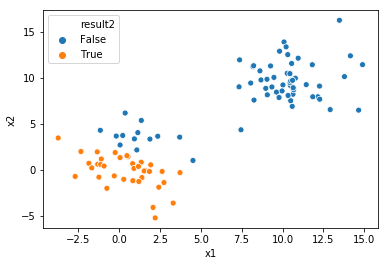

In [99]:
data_result["result2"] = 1/( 1+ np.exp( -X.dot(Wn) ) ) <= 0.5
sns.scatterplot(x = "x1", y = "x2", hue = "result2", data = data_result)